## AST4310, Autumn 2022, Project 3

Authored by (candidate numbers): ***XXX*** and ***YYY***.



#### Header and imports

In [52]:
%matplotlib inline
# Only if you have a high-resolution "retina" display:
%config InlineBackend.figure_format = 'retina'

import numpy
import numpy as np
from scipy import interpolate
from scipy.misc import derivative

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import matplotlib.patheffects as pe
from matplotlib.patches import Rectangle

plt.rc('legend', frameon=False)
plt.rc('figure', figsize=(10, 8))  # Larger figure sizes
plt.rc('image', origin='lower')  # Make image zero on bottom
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams["figure.figsize"] = (8,8)
plt.rcParams['font.size'] =  16.0

from astropy import units
from astropy import constants
from astropy.table import QTable  # to use tables with units
from astropy.visualization import quantity_support
quantity_support()

from functools import wraps # This convenience func preserves name and docstring

i_units = units.Quantity(1, unit="kW m-2 sr-1 Hz-1")

#### Reading the data file 

In [2]:
DATA_FILE = 'sst_sunspot_617_2020.08.07.fits' 

data = QTable.read(DATA_FILE)

# Introduction

In this report we will analyse the intensity and stokes V data taken from a region of the sun, around a sunspot, at 13 different wavelengths around the rest wavelength of neutral iron. We have an image resolution of $974\times961$ pixels, with  each spatial pixel having a size of approximately 0.058 arcseconds. The images was taken with the Swedish 1-m Solar Telescope at La Palma.

Understanding sunspots are thought the be of high importance as it is believed they might affect solar activities such as coronal mass ejections or solar flares. These can have an effect on the earth and is therefore of intrest. We will look at the stokes V data to see how the magnetic field is affected by the sunspot.

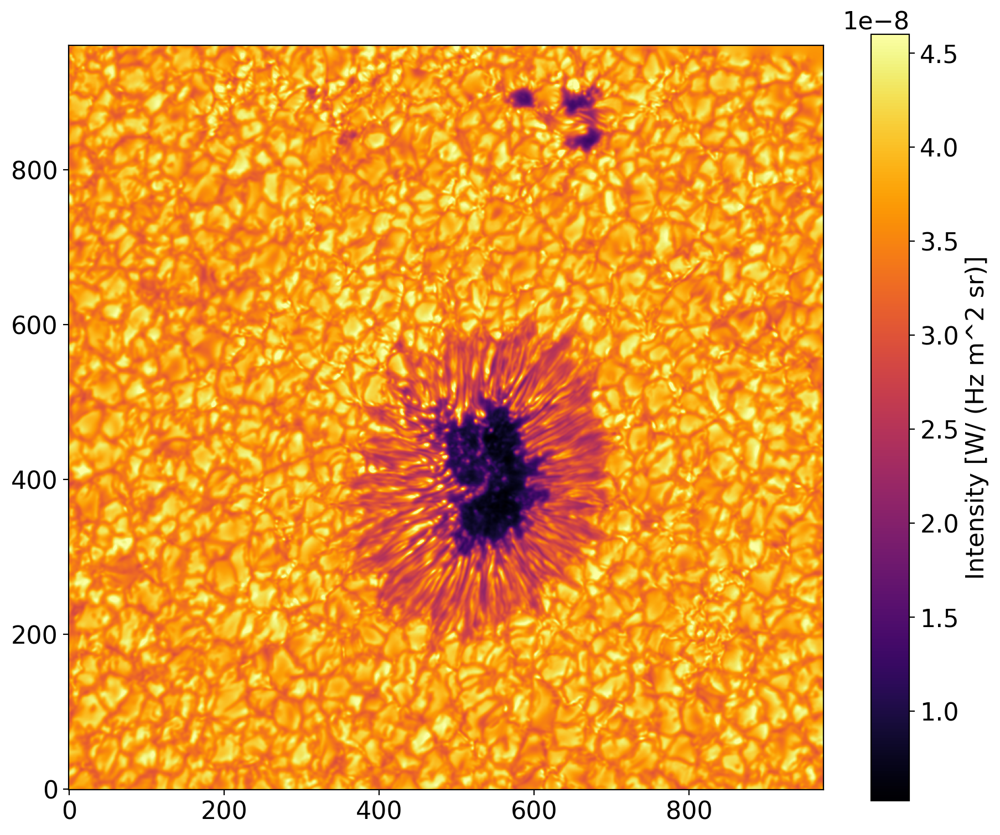

In [3]:
fig, ax = plt.subplots(figsize=(11,9))
im = ax.imshow(data['intensity'][0], vmax=4.6e-8, cmap='inferno')
cbar = fig.colorbar(im)
cbar.set_label(r'Intensity [W/ (Hz m^2 sr)]')

In the figure above, we visualize our data set for one specific wavelength. The colorbar shows the intensity of each pixel, with darker colors corresponding to lower intensity and vice versa. The large spot is our sunspot of interest, consisting of the dark umbra in the center and the surrounding penumbra. The granulated pattern surrounding the sunspot is due to the convective energy transport from the core of the Sun, out to the "surface".

In this report, we will analyse the spectral properties of the sunspot compared to the surrounding granulation. 

We start by calculating the brightness temperature using the Planck function and the continuum intensity. Then we use a Gaussian approximation to find the line of sight velocity and line width by moments. Lastly we look at the line of sight magnetic field by looking at the intensity and stokes V polarization, before presenting and discussing our results in the third section.

# Method

We start by investigating what is happening in the granulated pattern in the image. In order to find the pixel coordinates we want to use, we limit the x-and y-axis.

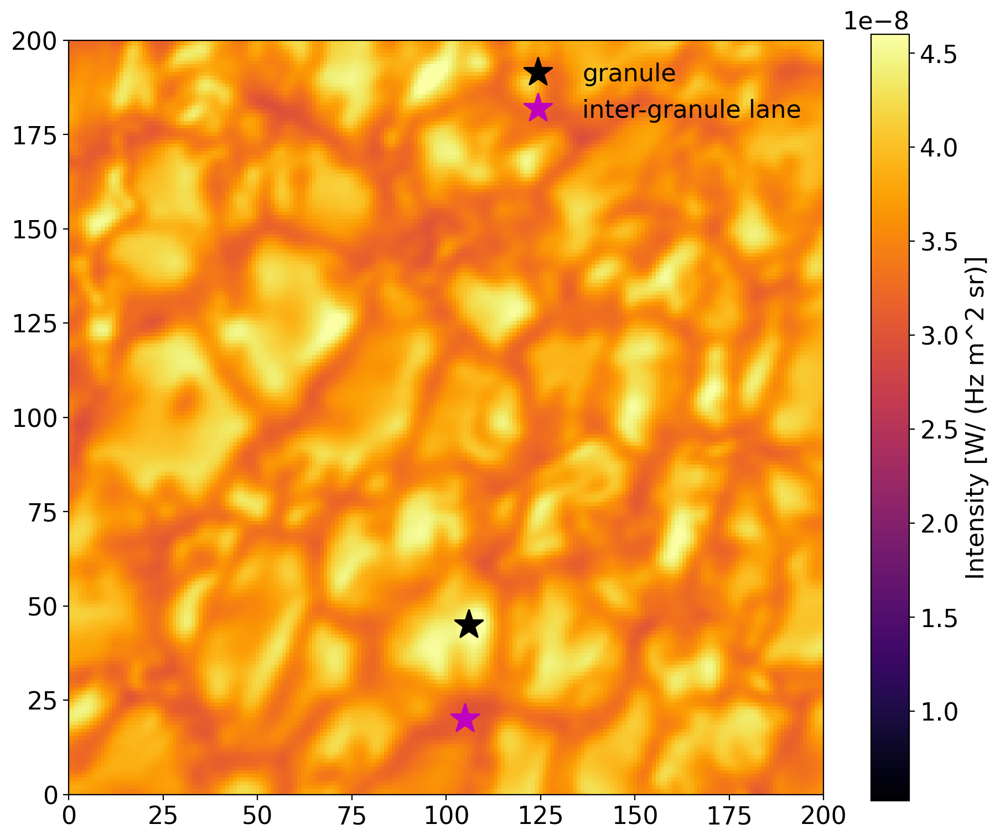

In [4]:
fig, ax = plt.subplots(figsize=(11,9))
im = ax.imshow(data['intensity'][0].value, vmax=4.6e-8, cmap='inferno');
ax.set_xlim([0,200])
ax.set_ylim([0,200])
ax.plot([106, 106], [45,45], "k*", label="granule", markersize=20)
ax.plot([105, 105], [20,20], "m*", label="inter-granule lane", markersize=20)
cbar = fig.colorbar(im)
cbar.set_label(r'Intensity [W/ (Hz m^2 sr)]')
ax.legend()

In [5]:
cont_gran = data['intensity'][0, 45, 106]
cont_lane = data['intensity'][0, 20, 105]

print("Intensity granule continuum:", cont_gran)
print("Intensity granule lane continuum:", cont_lane)

Intensity granule continuum: 4.584241608540651e-08 W / (Hz m2 sr)
Intensity granule lane continuum: 3.116997859820003e-08 W / (Hz m2 sr)


The plot show the varying intensity for wavelength $617.268\rm ~ nm$.  The star-shaped markers in the plot show what granule and inter granule lane we are using to look at the difference.
Computing the two intensities.

**Class**

Now we create a class to hold the dataset. This class can then be expanded with methods needed for calculationg and data analysis.

In [6]:
class solar_spot:
    def __init__(self, DATA_FILE, rest_wavelength_):
        """
        Takes in DATA_FILE as string argument and rest_wavelength_ in [nm] and stores as variables
        """
        self.data = QTable.read(DATA_FILE)
        self.wave0 = rest_wavelength_
        
        self.data['intensity'] = self.data['intensity'].to('nW m^-2 Hz^-1 sr^-1')
        
        #calculating inverted porofiles for later use
        self.data['intensity_inverted'] = self.data['intensity'][0] - self.data['intensity']
        self.data['stokes_v_inverted'] = self.data['stokes_v'][0] - self.data['stokes_v']

## Brightness temperature and velocity 

We can connect the observed intensity $I_{\lambda}^{\rm obs}$ and the brightness temperature from the following relation: 

\begin{align}
     B_{\lambda}(T_b) = I_{\lambda}^{\rm obs},
\end{align}

where $B_{\lambda}(T_b)$ is the Planck function for wavelength. Since our intensity from the data set has units $\rm [W /(Hz~m^2 ~sr)]$, we have to use the Planck function for frequency, $B_{\nu}$, in order to calculate the brightness temperature. The Planck function $B_{\nu}$ can then be expressed by: 

\begin{align}
    B_{\nu} = \frac{2h\nu^3}{c^2} \frac{1}{\exp\left( \frac{h\nu}{k_B T}\right) - 1}
\end{align}

By rewriting $B_{\nu}$, we can express the brightness temperature $T_b$ as: 

\begin{align}
    T_b = \frac{h\nu}{k_B\ln \left( 1 + \frac{2h\nu^3}{I_{\nu}^{\rm obs}c^2} \right)}
\end{align}

We the implement this in our code, and use the intensity data of one wavelength, as in the image above, to show the corresponding brightness temperature. We also compute the brightness temperature in the granule and inter granule lane. The resulting temperatures and plot can be seen in the result section. 

In [7]:
def calculate_brightness_temperature(self):
    #adding brightness temperature to dataset
    k, h, c = constants.k_B, constants.h, constants.c

    nu = self.data['wavelength'].to(units.Hz, equivalencies=units.spectral())
    intensity = self.data['intensity']

    T_b = h*nu/k * numpy.log((2*h*nu**3)/(c**2 * intensity.T*units.sr) + 1)**(-1)
    T_b = T_b.decompose()
    self.data['brightness_temperature'] = T_b.T

solar_spot.calculate_brightness_temperature = calculate_brightness_temperature

Radiation from bodies that experiences large-scale movement, is shifted. The spectra of the moving bodies will therefore not be the same as if the bodies were static. This shift can be expressed by the Doppler effect: 

\begin{align} 
    \frac{\lambda_0 -\lambda}{\lambda_0} = \frac{\Delta \lambda}{\lambda_0} = \frac{v}{c},
\end{align}

where $\lambda$ is the observed wavelength that is being Doppler shifted, $\lambda_0$ is the rest wavelength, $c$ is the speed of light in vacuum and $v$ is the velocity of the moving body. 

By using the Doppler shift, we can calculate the velocity of the gas in the granules and inter granule lanes, by comparing their central wavelength to the central rest wavelength: $\lambda_0 = 617.30\rm ~nm$. Before computing the velocities, we want to do a fitting of the spectral data, to easier compare the spectra. 

One way to do a fitting of a spectra, is by a Gaussian fitting. But, an easier and robust way of approximating the spectra is by calculating the first and second moments. They are also known as the expected value $\mu$ and the variance $\sigma^2$ of a Gaussian distribution respectfully. A more stable way of fitting is also to first invert the intensity data, before approximating the curves: $I_{\rm inv} = I_0 - I_{\lambda}$. 

In [8]:
def calculate_moments(self): 
    sp = self.data['intensity_inverted']
    wv = self.data['wavelength']
    wave0 = self.wave0

    #calculating moments
    moment1 = numpy.trapz(wv[:, numpy.newaxis, numpy.newaxis] * sp, wv, axis=0) / numpy.trapz(sp, wv, axis=0)
    moment2 = numpy.trapz((wv[:, numpy.newaxis, numpy.newaxis] - moment1)**2 * sp, wv, axis=0)\
                          / numpy.trapz(sp, wv, axis=0)
    moment2[moment2 < 0] = 0
    
    self.moment1 = moment1
    self.moment2 = moment2
    
solar_spot.calculate_moments = calculate_moments

Since the spectral curves are now inverted, the peaks correspond to the expected values. We therefore use the first moment $\mu$ as the Doppler shifted wavelength in the expression. Rewriting the Doppler shift to an expression for the velocitiy gives us then:

\begin{align} 
    v = \frac{c(\lambda_0 - \lambda)}{\lambda_0} = \frac{c(\lambda_0 - \mu)}{\lambda_0}
\end{align}

Here, $v$ correspond to the "Line of Sight" (LOS) velocity, meaning it is not the actual velocity of the moving body but what we measure due to our relative position compared to the area of interest. The actual velocity would then be: $v = v_{los}\cos(\theta)$. 

Since we only have measurements from one telescope, it is impossible for us to compute the actual velocity. But, since we are mostly interested in comparing the velocities of different parts of the data set, the line $v_{\rm los}$ will be sufficient.

In the results section we have added an image of the velocity in each pixel. 

In [9]:
def calculate_v_los_FWHM(self):
    wave0 = self.wave0; moment1 = self.moment1; moment2 = self.moment2
    #line of sight velocity 
    v_los = (constants.c * (wave0 - moment1) / wave0).to('km/s')

    #Full width half maximum
    FWHM = 2*np.sqrt(2*np.log(2)) * np.sqrt(moment2)
    #converting to km/s
    FWHM *= constants.c/rest_wavelength
    
    self.FWHM = FWHM.to('km/s')
    self.v_los = v_los
    
solar_spot.calculate_v_los_FWHM = calculate_v_los_FWHM

We will then implement the normal distribution function to see how well this represents the data at a given wavelength. 
$$
  f(x, \mu, \sigma) = \frac{1}{\sigma\sqrt{2\pi}} 
  \exp\left( -\frac{1}{2}\left(\frac{x-\mu}{\sigma}\right)^{\!2}\,\right).
$$

In [10]:
def calculate_gaussian_fit(self, x, y, wavelengths):
    """
    Input is point x,y where gaussian is fit and an array of wavelengths with any number of points.
    Finds gaussian fit at given point x,y for an array of wavelengths
    Returns dict with gaussian fit for the intensity, inverted intensity and their derivatives
    """
    data = self.data; moment1 = self.moment1; moment2 = self.moment2

    def gaussian(x, mu, var): 
        """Regular 1D-PDF"""
        return 1/(numpy.sqrt(var)*numpy.sqrt(2*numpy.pi))*numpy.exp(-0.5*(x-mu)**2/var)
    
    def dgaussian_dx(x, mu, var, f=gaussian):
        """Derivative of 1D-PDF"""
        return - f * (x-mu)/var

    def scaleBetween(unscaledNum, minAllowed, maxAllowed, minNum, maxNum):
        """
        This is for scaling the gaussian with the right units
        """
        return (maxAllowed - minAllowed) * (unscaledNum - minNum) / (maxNum - minNum) + minAllowed;

    #setting up dict for different fits
    fits = {}
    
    fits['intensity_inverted'] = gaussian(wavelengths, moment1[y,x], moment2[y,x])
    #fixing units
    fits['intensity_inverted'] *= units.nm * i_units
    #scaling
    fits['intensity_inverted'] = scaleBetween(fits['intensity_inverted']\
                                              , numpy.min(data['intensity_inverted'][:,y,x])\
                                              , numpy.max(data['intensity_inverted'][:,y,x])\
                                              , numpy.min(fits['intensity_inverted'])\
                                              , numpy.max(fits['intensity_inverted']))

    fits['intensity_inverted_derivative'] = dgaussian_dx(wavelengths\
                                                         , moment1[y,x]\
                                                         , moment2[y,x]\
                                                         , fits['intensity_inverted'])

    #inverting back, but now shape is correct so only scaling needed is to add intensity[0] value
    fits['intensity'] = fits['intensity_inverted'][0] + data['intensity'][0,y,x] - fits['intensity_inverted']

    fits['intensity_derivative'] = fits['intensity_inverted_derivative'][0] - fits['intensity_inverted_derivative']
    return fits

solar_spot.calculate_gaussian_fit = calculate_gaussian_fit

And this will then be compared with interpolation.

In [11]:
def calculate_interpolation_fit(self, x, y, kind_='quadratic'):
    data = self.data
    interpolation_function = interpolate.interp1d(data['wavelength']\
                                                  , data['intensity'][:, y, x], kind=kind_)
    return interpolation_function
    
solar_spot.calculate_interpolation_fit = calculate_interpolation_fit

The local differences between a normal distribution and interpolation can be quite big. But at a large scale these differences will be smoothed out, as we will see in the results. We then create some functions to plot these results.

In [12]:
def plot_gaussian_fit_on_intensity(self, ax, x, y, wavelengths, with_wave0=True):
    data = self.data
    
    if with_wave0:
        ax.axvline(x=self.wave0, ymin=0, ymax=1, linestyle='--', color='black', label=r"$\lambda_0$")
    
    fits = self.calculate_gaussian_fit(x, y, wavelengths)
    
    ax.set_xlabel("Wavelength [{}]".format(wavelengths.unit))
    ax.set_ylabel(r"Intensity [{}]".format(data['intensity'].unit))
    ax.scatter(data['wavelength'], data['intensity'][:,y,x], label="Data", color='blue')
    ax.plot(wavelengths, fits['intensity'], label="Gaussian fit", color='green')
    ax.legend()
    
solar_spot.plot_gaussian_fit_on_intensity = plot_gaussian_fit_on_intensity

In [13]:
def plot_interpolation_on_intensity(self, ax, x, y, wavelengths, kind_='quadratic', with_wave0=True, loc='lower left'):
    data = self.data
    if with_wave0:
        ax.axvline(x=self.wave0, ymin=0, ymax=1, linestyle='--', color='black', label=r"$\lambda_0$")
    
    interpolation_function = self.calculate_interpolation_fit(x, y, kind_=kind_)
    
    ax.set_xlabel("Wavelength [{}]".format(wavelengths.unit))
    ax.set_ylabel(r"Intensity [{}]".format(data['intensity'].unit))
    ax.scatter(data['wavelength'], data['intensity'][:,y,x], label="Data", color='blue')
    ax.plot(wavelengths, interpolation_function(wavelengths), label="{} interpolation".format(kind_), color='green')
    ax.legend(loc=loc)
    
solar_spot.plot_interpolation_on_intensity = plot_interpolation_on_intensity

#### Spectral properties

We will shift our focus to the sunspot, and look how its spectral properties differ from the neigbouring granulation.

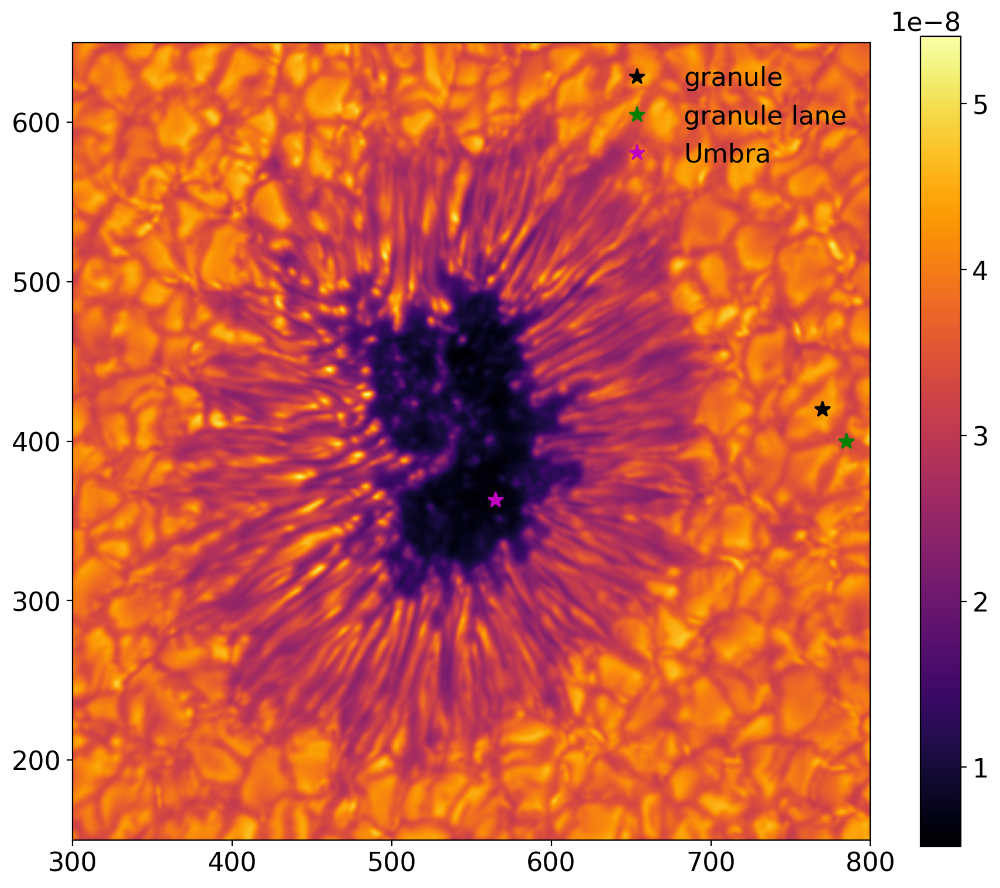

In [14]:
fig, ax = plt.subplots(figsize=(11,9))
im = ax.imshow(data["intensity"][0] , cmap='inferno', origin='lower')#, vmin=-3, vmax=3); #viridis, plasma, Blues, Oranges, cool, Spectral, coolwarm, rainbow, jet
cbar = fig.colorbar(im)
ax.set_xlim([300,800])
ax.set_ylim([150,650])
ax.plot([770, 770], [420,420], "k*", label="granule", markersize=10)
ax.plot([785, 785], [400,400], "g*", label="granule lane", markersize=10)
ax.plot([565, 565], [363,363], "m*", label="Umbra", markersize=10)
ax.legend()

Using $v = c\Delta \lambda/\lambda_0$, we can convert the width of the line $\Delta \lambda$ from units of length to km/s. Since the square root of the second moment, $\sigma$ is the standard deviation, we will use this as the $\Delta \lambda$. 

The Zeeman effect is what dominates the width of the spectral lines in the sunspots and it occurs in the presence of a magnetic field, when spectral lines split up into two or more lines. The seperation of the lines, $\Delta \lambda_B$ can be expressed by: 

\begin{align}
    \Delta\lambda_B = \frac{e}{4\pi m_ec}\lambda_0^2 B,
\end{align}

where $B$ is the magnetic field and $m_e$ is the mass of an electron. **Ask why we do not include the Zeeman splitting in the expression (see CruzRodriguez book)**

Using the line seperation, one can determine the magentic fields present. But due to the properties of the spectral lines and magnetic fields in the Sun, the lines are not fully split by the Zeeman effect. Instead we will use the circular polarization of the light. 

When radiation is polarized, either fully or partially, we cannot describe it based intensity alone. One of the quantity needed is the degree of polarization, which is further split into three parameters. One of these parameters is the "Stokes V", which gives us the difference in the right-handed and left-handed circular polarization of the radiation. (see main Lecture Note). We can express Stokes V ($V_{\lambda}$), assuming "Weak Field Approximation", as: 

\begin{align}
    V_{\lambda} = -\Delta \lambda_B \bar{g}\cos{\theta} \frac{\partial I_{\lambda}}{\partial \lambda},
\end{align}

where $\bar{g}$ is the effective Landé factor and $\theta$ is the angle between the line of sight and the magnetic field vector. Combinging the expressions for $\Delta \lambda_B$ and $V_{\lambda}$ we can compute the line of sight component of the magnetic field, $B_{\rm los} = B\cos\theta$. 

Due to noise and other instrumental effects, we will use the formulation of $B_{\rm los}$: 

\begin{align}
    B_{\rm los} = -\frac{4\pi m_e c}{e\bar{g} \lambda^2_0}\frac{\sum_{\lambda} \frac{\partial I}{\partial \lambda} V_{\lambda}}{\sum_{\lambda} (\frac{\partial I}{\partial \lambda})^2}
\end{align}

In [15]:
def calculate_B_los(self):
    """
    calculates line of sight magnetic field strength
    """
    #fetching some constants
    pi = numpy.pi
    m_e = constants.m_e
    c = constants.c
    e = constants.e.si
    g = 2.499 #Lande factor
    
    wave0 = self.wave0; data = self.data
    
    diff_intensity = numpy.diff(data['intensity'], axis=0)
    diff_wl = numpy.diff(data['wavelength'])
    dIdlambda = diff_intensity.T/diff_wl
     
    const = -4 * pi * m_e * c / (e * g * rest_wavelength**2)
    
    B_los = const * (np.sum(dIdlambda.T * data['stokes_v'][0:-1], axis=0)/ np.sum(dIdlambda**2,axis=2).T)
    
    self.B_los = B_los.to('gauss')

solar_spot.calculate_B_los = calculate_B_los

We then use the call function of our class to calculate all of these values.

In [16]:
def __call__(self):
    self.calculate_moments()
    self.calculate_v_los_FWHM()
    self.calculate_brightness_temperature()
    self.calculate_B_los()
    
solar_spot.__call__ = __call__

### Plotting

First we create a general plot function that makes canvas of xy-dimension with a colorbar, which we can base the rest of our plotting functions on.

In [17]:
def plot_with_colorbar(plot_data, ax, axlim, cmap_, clim_, label_):
    if not all(i is None for i in axlim):
        ax.set_xlim(axlim[0], axlim[1])
        ax.set_ylim(axlim[2], axlim[3])
    
    im = ax.imshow(plot_data, cmap=cmap_)
    if clim_!= None: 
        im.set_clim(clim_[0],clim_[1])
        
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label(label_)
    
    return im

Then we create the individual plotting functions using the base function above.

In [18]:
def plot_intensity(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]
    
    plot_data = self.data['intensity'][wavelength_index]
    
    label_ = r"Intensity [{}]".format(plot_data.unit)
 
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_intensity = plot_intensity

In [19]:
def plot_stokes_v(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='gist_gray', clim_=None):
        axlim = [xmin, xmax, ymin, ymax]
    
        plot_data = self.data['stokes_v'][wavelength_index]

        label_ = r"Stokes V [{}]".format(plot_data.unit)

        return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_stokes_v = plot_stokes_v

In [20]:
def plot_los_velocity(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='RdBu', clim_=(-3,3)):
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.v_los

    label_ = r'Velocity [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_los_velocity = plot_los_velocity

In [21]:
def plot_brightness_temperature(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):  
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.data['brightness_temperature'][wavelength_index]

    label_ = r'Temperature [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_brightness_temperature = plot_brightness_temperature

In [22]:
def plot_B_los(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.B_los

    label_ = r'Magnetic field [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_B_los = plot_B_los

In [23]:
def plot_FWHM(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='RdBu_r', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]
    
    plot_data = self.FWHM
    
    label_ = r'FWHM [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_FWHM = plot_FWHM

We then create three functions to display information on the plots. First a scale bar, which is placed on the plot and shows a fixed distance in kilometers.

In [24]:
fontprops = fm.FontProperties(size=16, weight="bold")
real_world_pixel_length = 42.46 #in km

def add_scale_bar(ax, color_='white', bar_length_percentage = 0.25, loc='lower left'):
    xsize = ax.get_xlim()[1] - ax.get_xlim()[0]
    full_length = real_world_pixel_length * xsize

    percentage_occupied = 0.25
    #calculating length of bar in km
    bar_length = xsize * bar_length_percentage * real_world_pixel_length
    #scaling to closest base10 number
    scaled_bar_length = 10**(np.floor(np.log10(bar_length)-np.log10(0.5)))
    #finding the pixel length of scaled_bar
    nex_xsize = int(scaled_bar_length/real_world_pixel_length)

    scaled_bar_length *= units.km
    
    scalebar = AnchoredSizeBar(ax.transData, nex_xsize, r'{:.0f}'.format(scaled_bar_length), loc, pad=0.2\
                           , borderpad=0.3, color=color_, frameon=False\
                           , size_vertical=4, fontproperties=fontprops)

    ax.add_artist(scalebar)    

Second, a function that creates a line between two points and displays the length of the line in kilomters.

In [25]:
def add_distance_line(ax, line_start, line_end, line_color='red', stroke_color='white'):
    x1 = line_start[0]; x2 = line_end[0]
    y1 = line_start[1]; y2 = line_end[1]
    
    #adding line between points
    ax.plot([x1,x2], [y1,y2], 'o-', color=line_color, lw=2\
               , path_effects=[pe.Stroke(linewidth=4, foreground=stroke_color), pe.Normal()])

    #calculating line length with pytagoras
    line_length = np.sqrt((x2-x1)**2 + (y2-y1)**2)\
                * real_world_pixel_length * units.km
    #calulating midpoint of line
    line_midpoint = [int((x1+x2)/2), int((y1+y2)/2)]
    
    #calculating angle to rotate text on line
    #first quadrant
    if (y2-y1)>=0 and (x2-x1)>=0:
        line_rot = np.arctan((y2-y1)/(x2-x1))

    #second quadrant
    if (y2-y1)>=0 and (x2-x1)<0:
        line_rot = np.arctan((x1-x2)/(y2-y1)) + np.pi/2 + np.pi

    #third quadrant
    if (y2-y1)<0 and (x2-x1)<0:
        line_rot = np.arctan((y1-y2)/(x1-x2)) + 2*np.pi

    #fourth quadrant
    if (y2-y1)<0 and (x2-x1)>=0:
        line_rot = np.arctan((y2-y1)/(x2-x1)) + 2*np.pi

    line_rot = np.degrees(line_rot)
    #adding text to line
    ax.text(line_midpoint[0], line_midpoint[1], '{:.0f}'.format(line_length), color=line_color,\
              path_effects=[pe.withStroke(linewidth=3, foreground=stroke_color)]\
              ,horizontalalignment='center',verticalalignment='center', fontsize='20', rotation = line_rot)

And third, a function the places a marker on a spot (x,y) and displays the brightness temperature, FWHM or $B_{los}$ at that location.

In [26]:
def plot_point_of_intrest(self, ax, x, y, label, main_color, edge_color='black'\
                          , size=20, T_b=False, wavelength_index=None\
                          , FWHM=None, B_los=None):
                          
    ax.plot([x,x], [y,y], marker = 'o', markersize=size, markeredgecolor=edge_color\
            , markerfacecolor=main_color, label=label)
    
    if T_b:
        point_value = self.data['brightness_temperature'][wavelength_index, y, x]

    elif FWHM:
        point_value = self.FWHM[y,x]
        
    elif B_los:
        point_value = self.B_los[y,x]
    
    if T_b or FWHM or B_los:
        ax.text(x+5, y, '{:.0f}'.format(point_value), color=main_color,\
                  path_effects=[pe.withStroke(linewidth=2, foreground=edge_color)]\
                  ,horizontalalignment='left',verticalalignment='center', fontsize=size*3)      

    ax.legend()
    
solar_spot.plot_point_of_intrest = plot_point_of_intrest

We also add a function to plot the average intensity of a region and a function that draws a box around this region.

In [129]:
def plot_rectangle(ax, xmin, xmax, ymin, ymax, color='blue', lw=4):
    width = xmax-xmin
    height=ymax-ymin
    rect = plt.Rectangle((xmin, ymin), width, height,edgecolor=color, alpha=1, lw=lw, fc='none')

    ax.add_patch(rect)

In [122]:
def plot_average_intensity(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, with_wave0=True, linecolor='blue', label=None):
    if with_wave0:
        ax.axvline(x=self.wave0, ymin=0, ymax=1, linestyle='--', color='black', label=r"$\lambda_0$")
    
    axlim = [xmin, xmax, ymin, ymax]
    
    if not all(i is None for i in axlim):
        average_intensity = numpy.mean(self.data['intensity'][:,ymin:ymax,xmin:xmax], axis=(1,2))
        ax.plot(self.data['wavelength'], average_intensity, color=linecolor, label=label)
    else:
        average_intensity = numpy.mean(self.data['intensity'], axis=(1,2))
        ax.plot(self.data['wavelength'], average_intensity, color=linecolor, label=label)
        
    ax.set_xlabel("Wavelength [{}]".format(self.data['wavelength'].unit))
    ax.set_ylabel(r"Intensity [{}]".format(self.data['intensity'].unit))

solar_spot.plot_average_intensity = plot_average_intensity  

# Results

### Adding class pointer and calling class

In [72]:
DATA_FILE = 'sst_sunspot_617_2020.08.07.fits'
rest_wavelength = 617.30 * units.nm #FeI

SST_sunspot = solar_spot(DATA_FILE, rest_wavelength)
SST_sunspot()

# Testing average plot thing

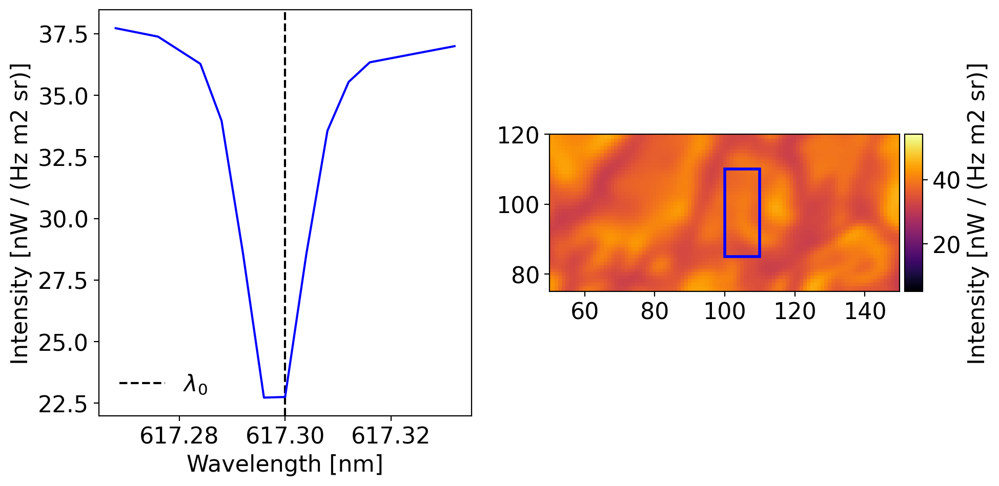

In [130]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
SST_sunspot.plot_average_intensity(ax[0], xmin=100, xmax=110, ymin=85, ymax=110, linecolor='blue')

ax[0].legend(loc='lower left')
SST_sunspot.plot_intensity(ax[1], wavelength_index=0, xmin=50, xmax=150, ymin=75, ymax=120)

plot_rectangle(ax[1], xmin=100, xmax=110, ymin=85, ymax=110, color='blue', lw=2)


fig.tight_layout()

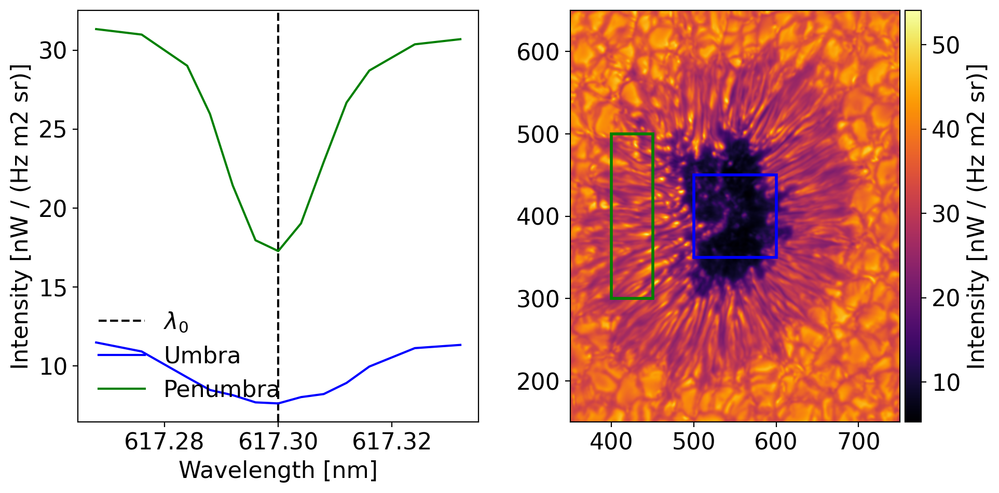

In [131]:
first_rect = [500, 600, 350, 450] #xmin, xmax, ymin, ymax
xmin = 500; xmax = 600; ymin=350; ymax=450

fig, ax = plt.subplots(1,2,figsize=(10,5))

SST_sunspot.plot_average_intensity(ax[0], xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, linecolor='blue', label='Umbra')
plot_rectangle(ax[1], xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, color='blue', lw=2)

xmin = 400; xmax = 450; ymin = 300; ymax = 500

SST_sunspot.plot_average_intensity(ax[0], xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, linecolor='green', label='Penumbra', with_wave0=False)
plot_rectangle(ax[1], xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, color='green', lw=2)

ax[0].legend(loc='lower left')

SST_sunspot.plot_intensity(ax[1], wavelength_index=0, xmin=350, xmax=750, ymin=150, ymax=650)

fig.tight_layout()

# TESTING THE FUNCTIONS

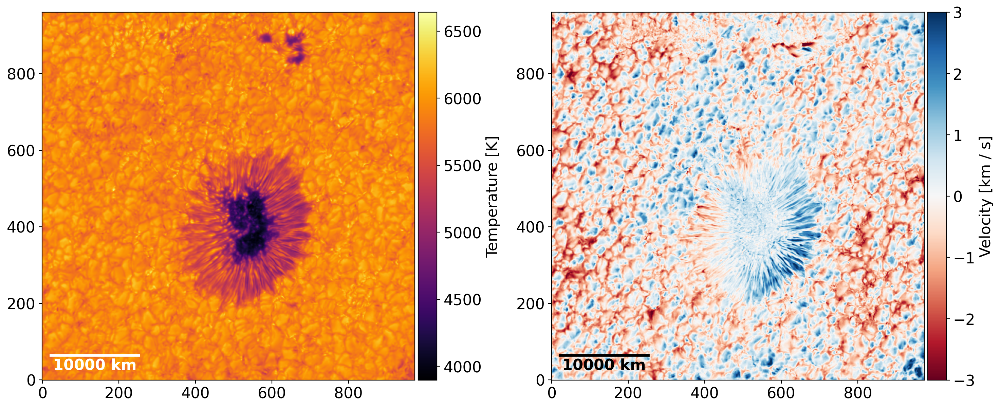

In [37]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_brightness_temperature(ax[0], wavelength_index=3)
im2 = SST_sunspot.plot_los_velocity(ax[1])
add_scale_bar(ax[0])
add_scale_bar(ax[1], color_='black')

fig.tight_layout()

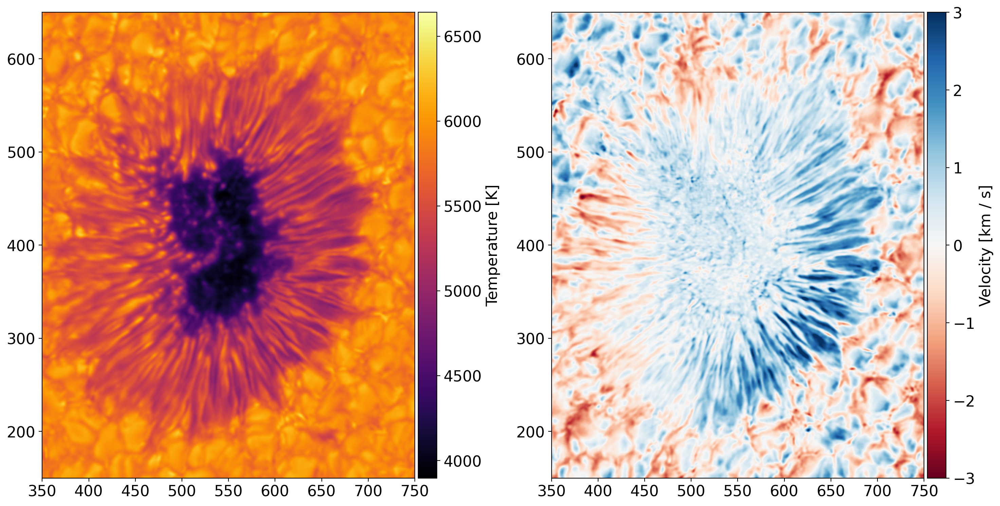

In [38]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_brightness_temperature(ax[0], wavelength_index=3,xmin=350, xmax=750, ymin=150, ymax=650)
im2 = SST_sunspot.plot_los_velocity(ax[1],xmin=350, xmax=750, ymin=150, ymax=650)

fig.tight_layout()

## Just checking if interpolation works better (it does)

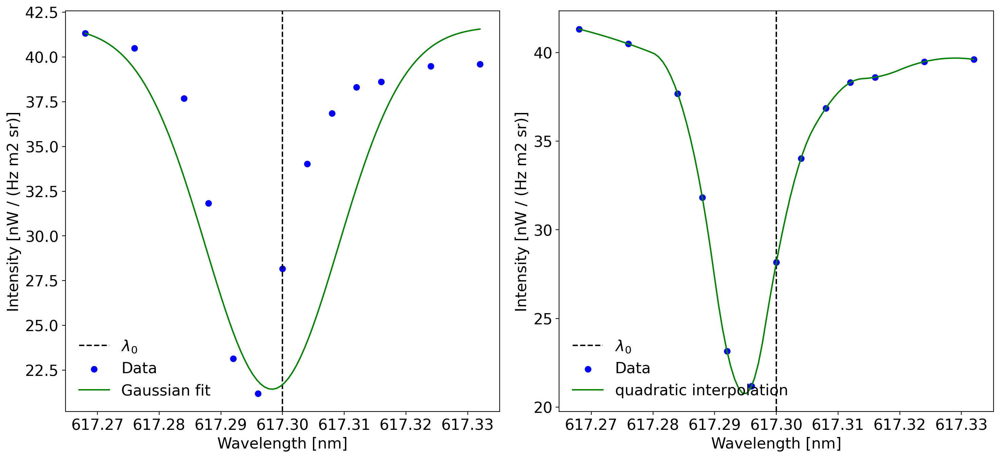

In [39]:
wavelengths = numpy.linspace(SST_sunspot.data['wavelength'][0], SST_sunspot.data['wavelength'][-1], 100)

plot_location =[100, 200]

fig, ax = plt.subplots(1,2, figsize=(15,7)) 
SST_sunspot.plot_gaussian_fit_on_intensity(ax[0], plot_location[0], plot_location[1], wavelengths)

SST_sunspot.plot_interpolation_on_intensity(ax[1], plot_location[0], plot_location[1], wavelengths)

fig.tight_layout()

## Magnetic field vs. intensity

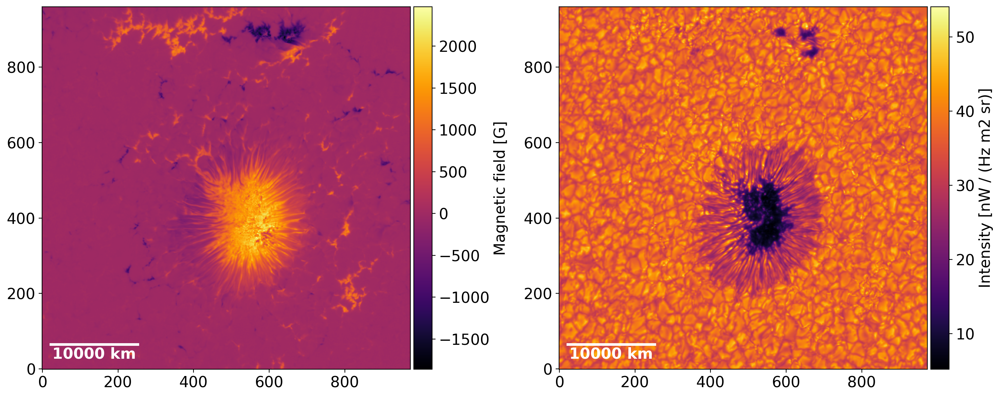

In [61]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_B_los(ax[0])
im2 = SST_sunspot.plot_intensity(ax[1], wavelength_index=0)
add_scale_bar(ax[0])
add_scale_bar(ax[1])

fig.tight_layout()

## Example with distance plotted between two points

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))

im = SST_sunspot.plot_brightness_temperature(ax, wavelength_index=3, xmin=300, xmax=750, ymin=150, ymax=650)

line_start = [380, 400]; line_end = [680, 400]
add_distance_line(ax, line_start, line_end, line_color='black')

#line_start = [500, 200]; line_end = [600, 600]
#add_distance_line(ax, line_start, line_end)

# diameter of earth is 12 742 km

## Example on plotting dot on point of intrest

In [ ]:
fig, ax = plt.subplots(figsize=(7,7)) 

wl_index = 0


im = SST_sunspot.plot_brightness_temperature(ax, wavelength_index=wl_index, xmin=0, xmax=200, ymin=0, ymax=200)

SST_sunspot.plot_point_of_intrest(ax, x=106, y=45, label='Granule', main_color='b', size=5, wavelength_index=wl_index, T_b=True)
SST_sunspot.plot_point_of_intrest(ax, x=105, y=20, label='Inter-granular lane', main_color='r', size=5, wavelength_index=wl_index, T_b=True)

#Need to convert to microtesla to see anything here
#SST_sunspot.plot_point_of_intrest(ax, x=106, y=45, label='Granule', main_color='b', size=5, wavelength_index=wl_index, B_los=True)
#SST_sunspot.plot_point_of_intrest(ax, x=105, y=20, label='Inter-granular lane', main_color='r', size=5, wavelength_index=wl_index, B_los=True)

